# NBA players classification

## Setup

### Installation

### Importation (packages, modules, libraries)

In [2]:
%load_ext autoreload
%autoreload 2

In [199]:
import os
import numpy as np
import pandas as pd
import matplotlib
import seaborn as sns
from matplotlib import pyplot as plt
from mpdatanba.scoring import score_classifier
from mpdatanba import PARENT_BASE_PATH, BASE_PATH
from mpdatanba.preprocessor import Loader, Preprocessor
from mpdatanba.ml_logic.ml_workflow import MlModelWorkflow
from sklearn.metrics import recall_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb

## Data loading

let's see in which directery we are now

In [200]:
!pwd

/Users/ramansheshka/code/test_datascience_mpdata/notebooks


In [201]:
# call of the package mpdatanba initialized the parent path: BASE_PATH and PARENT_BASE_PATH
# note it's not very elegant to initialize the path in package init instance, the better was is to use a proper config file
print(BASE_PATH)
print(PARENT_BASE_PATH)

/Users/ramansheshka/code/test_datascience_mpdata/mpdatanba
/Users/ramansheshka/code/test_datascience_mpdata


In [202]:
# we can now import the data, the data are stored in the data folder, the best way it's would be to use a bucket in the cloud
# but for this test we will use the local data, the data are stored in the data folder data
# we use a class Loader to load the data, the data are stored in the data folder
loader = Loader()

Data loaded from /Users/ramansheshka/code/test_datascience_mpdata/data
columns : ['Name', 'GP', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3P Made', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK', 'TOV', 'TARGET_5Yrs']
have been slugified to:
columns : ['name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov', 'target_5yrs']


## Exploratory Data Analysis : EDA 

In [203]:
df_raw = loader._df_raw
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         1340 non-null   object 
 1   gp           1340 non-null   int64  
 2   min          1340 non-null   float64
 3   pts          1340 non-null   float64
 4   fgm          1340 non-null   float64
 5   fga          1340 non-null   float64
 6   fg_pca       1340 non-null   float64
 7   3p_made      1340 non-null   float64
 8   3pa          1340 non-null   float64
 9   3p_pca       1329 non-null   float64
 10  ftm          1340 non-null   float64
 11  fta          1340 non-null   float64
 12  ft_pca       1340 non-null   float64
 13  oreb         1340 non-null   float64
 14  dreb         1340 non-null   float64
 15  reb          1340 non-null   float64
 16  ast          1340 non-null   float64
 17  stl          1340 non-null   float64
 18  blk          1340 non-null   float64
 19  tov   

  - The dataset has 21 columns and 1340 rows
  - name columns is a string, all other data types are numericals 

In [204]:
df_raw.sample(5)

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
345,John Battle,64,10.0,4.3,1.6,3.5,45.5,0.0,0.1,0.0,...,1.6,72.8,0.2,0.8,1.0,1.2,0.4,0.1,0.7,1.0
677,Paul George,61,20.7,7.8,2.9,6.5,45.3,0.7,2.3,29.7,...,1.7,76.2,0.6,3.1,3.7,1.1,1.0,0.4,1.1,1.0
228,Hollis Thompson,77,22.6,6.0,2.2,4.8,46.0,0.9,2.2,40.1,...,0.9,71.2,0.9,2.3,3.2,0.9,0.7,0.2,0.8,0.0
989,Tamar Slay,36,7.6,2.6,1.1,2.9,37.9,0.2,0.7,28.0,...,0.3,70.0,0.2,0.6,0.9,0.4,0.4,0.1,0.6,0.0
985,Dan Dickau,50,10.3,3.7,1.4,3.4,41.2,0.4,1.2,36.1,...,0.5,80.8,0.2,0.7,0.9,1.7,0.3,0.0,1.1,1.0


Let's check nan values

In [205]:
#nan values
display(df_raw.isna().sum())
# let's see the rows with nan values
display(df_raw[df_raw.isna().any(axis=1)])

name            0
gp              0
min             0
pts             0
fgm             0
fga             0
fg_pca          0
3p_made         0
3pa             0
3p_pca         11
ftm             0
fta             0
ft_pca          0
oreb            0
dreb            0
reb             0
ast             0
stl             0
blk             0
tov             0
target_5yrs     0
dtype: int64

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
338,Ken Johnson,64,12.7,4.1,1.8,3.3,52.8,0.0,0.0,NaN,...,1.3,43.5,1.4,2.4,3.8,0.3,0.2,0.3,0.9,0.0
339,Ken Johnson,64,12.7,4.1,1.8,3.3,52.8,0.0,0.0,NaN,...,1.3,43.5,1.4,2.4,3.8,0.3,0.2,0.3,0.9,0.0
340,Pete Williams,53,10.8,2.8,1.3,2.1,60.4,0.0,0.0,NaN,...,0.8,42.5,0.9,1.9,2.8,0.3,0.4,0.4,0.4,0.0
358,Melvin Turpin,79,24.7,10.6,4.6,9.0,51.1,0.0,0.0,NaN,...,1.8,78.4,2.0,3.8,5.7,0.5,0.5,1.1,1.5,1.0
386,Jim Petersen,60,11.9,3.2,1.2,2.4,48.6,0.0,0.0,NaN,...,1.1,75.8,0.7,1.7,2.5,0.5,0.2,0.5,1.2,1.0
397,Tom Scheffler,39,6.9,1.3,0.5,1.3,41.2,0.0,0.0,NaN,...,0.5,50.0,0.5,1.5,1.9,0.3,0.2,0.3,0.4,0.0
507,Sam Williams,59,18.2,6.1,2.6,4.7,55.6,0.0,0.0,NaN,...,1.5,55.1,1.5,3.7,5.2,0.6,0.8,1.3,1.1,0.0
509,Kurt Nimphius,63,17.2,5.3,2.2,4.7,46.1,0.0,0.0,NaN,...,1.7,58.3,1.5,3.2,4.7,1.0,0.3,1.3,0.9,1.0
510,Pete Verhoeven,71,17.0,4.9,2.1,4.2,50.3,0.0,0.0,NaN,...,1.0,70.8,1.5,2.1,3.6,0.7,0.6,0.3,0.8,1.0
521,Jim Smith,72,11.9,2.9,1.2,2.3,50.9,0.0,0.0,NaN,...,1.2,45.9,1.0,1.5,2.5,0.6,0.3,0.7,0.7,0.0


In [206]:
# replacing Nan values (only present when no 3 points attempts have been performed by a player)
column_name = '3p_pca'
array = df_raw[column_name].values
array_clean = np.nan_to_num(array,
                            nan=0.0
                            )
df_raw[column_name] = array_clean
#for x in np.argwhere(np.isnan(df_vals)):
#    df_vals[x]=0.0

In [207]:
assert all(df_raw.isna().sum().values == 0)

In [208]:
def print_unique_values(df : pd.DataFrame):
    """print the number of unique values for each column in the dataframe
    Args:
        data (pd.DataFrame): dataframe
    """
    values = {}
    for col in df.columns:
        number = df[col].nunique()
        print(f"{col}: has {number} of unique values")

In [209]:
print_unique_values(df_raw)

name: has 1294 of unique values
gp: has 70 of unique values
min: has 325 of unique values
pts: has 191 of unique values
fgm: has 87 of unique values
fga: has 159 of unique values
fg_pca: has 284 of unique values
3p_made: has 23 of unique values
3pa: has 54 of unique values
3p_pca: has 254 of unique values
ftm: has 59 of unique values
fta: has 76 of unique values
ft_pca: has 383 of unique values
oreb: has 44 of unique values
dreb: has 74 of unique values
reb: has 101 of unique values
ast: has 77 of unique values
stl: has 26 of unique values
blk: has 28 of unique values
tov: has 41 of unique values
target_5yrs: has 2 of unique values


In [16]:
def zeros_sparsity_df(df : pd.DataFrame):
    """print the number of zeros in each column of the dataframe
    Args:
        df (pd.DataFrame): dataframe
    """
    for col in df.columns:
        if col != 'target_5yrs' and col != 'name':
            count = (df[col] == 0).sum()
            print(f'# of zeros in column  {col} : {count}')

In [18]:
zeros_sparsity_df(df_raw)

# of zeros in column  gp : 0
# of zeros in column  min : 0
# of zeros in column  pts : 0
# of zeros in column  fgm : 0
# of zeros in column  fga : 0
# of zeros in column  fg_pca : 0
# of zeros in column  3p_made : 646
# of zeros in column  3pa : 360
# of zeros in column  3p_pca : 451
# of zeros in column  ftm : 1
# of zeros in column  fta : 1
# of zeros in column  ft_pca : 1
# of zeros in column  oreb : 4
# of zeros in column  dreb : 0
# of zeros in column  reb : 0
# of zeros in column  ast : 4
# of zeros in column  stl : 4
# of zeros in column  blk : 139
# of zeros in column  tov : 0


```3p_made, 3pa, 3p_pca, blk``` had some 0's values

Let's check of where is the duplicated rows. We start by elimination the true duplicated rows,

In [19]:
# duplicate rows
print(f"nb of true duplicated rows is: {df_raw.duplicated().sum()}")
# show duplicated rows
df_raw[df_raw.duplicated(keep=False)].sort_values(by='name')

nb of true duplicated rows is: 12


,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
366,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,...,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
369,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,...,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
368,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,...,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
365,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,...,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
169,Charles Smith,34,8.6,3.5,1.4,3.7,39.2,0.4,1.4,31.9,...,0.3,54.5,0.4,0.4,0.8,0.6,0.3,0.2,0.8,1.0
162,Charles Smith,60,8.7,2.9,1.0,2.2,44.4,0.0,0.1,0.0,...,1.3,69.7,0.2,0.9,1.2,1.7,0.6,0.1,0.6,1.0
168,Charles Smith,34,8.6,3.5,1.4,3.7,39.2,0.4,1.4,31.9,...,0.3,54.5,0.4,0.4,0.8,0.6,0.3,0.2,0.8,1.0
163,Charles Smith,60,8.7,2.9,1.0,2.2,44.4,0.0,0.1,0.0,...,1.3,69.7,0.2,0.9,1.2,1.7,0.6,0.1,0.6,1.0
166,Charles Smith,71,30.4,16.3,6.1,12.4,49.5,0.0,0.0,0.0,...,5.5,72.5,2.4,4.1,6.5,1.5,1.0,1.3,2.1,1.0
165,Charles Smith,71,30.4,16.3,6.1,12.4,49.5,0.0,0.0,0.0,...,5.5,72.5,2.4,4.1,6.5,1.5,1.0,1.3,2.1,1.0


In [20]:
# We have to drop duplicates
df_raw.drop_duplicates(inplace=True)
df_raw.reset_index(drop=True, inplace=True)

In [21]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1328 entries, 0 to 1327
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         1328 non-null   object 
 1   gp           1328 non-null   int64  
 2   min          1328 non-null   float64
 3   pts          1328 non-null   float64
 4   fgm          1328 non-null   float64
 5   fga          1328 non-null   float64
 6   fg_pca       1328 non-null   float64
 7   3p_made      1328 non-null   float64
 8   3pa          1328 non-null   float64
 9   3p_pca       1328 non-null   float64
 10  ftm          1328 non-null   float64
 11  fta          1328 non-null   float64
 12  ft_pca       1328 non-null   float64
 13  oreb         1328 non-null   float64
 14  dreb         1328 non-null   float64
 15  reb          1328 non-null   float64
 16  ast          1328 non-null   float64
 17  stl          1328 non-null   float64
 18  blk          1328 non-null   float64
 19  tov   

In [22]:
#let's check the data
assert df_raw[df_raw.duplicated(keep=False)].sort_values(by='name').shape[0] == 0, "There are still duplicated rows"

In [23]:
#let's see if we are eliminated all the duplicates, our id should be unique
assert df_raw['name'].nunique() == df_raw.shape[0], f"{df_raw['name'].nunique()} diff from {df_raw.shape[0]}. There are still duplicated rows"

AssertionError: 1294 diff from 1328. There are still duplicated rows

In [24]:
#show the duplicates rows based on the name
df_raw[df_raw.duplicated(subset=['name'], keep=False)].sort_values(by='name')

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
307,Bob Martin,43,6.7,3.4,1.2,3.1,37.8,0.1,0.3,20.0,...,1.5,63.6,0.3,0.7,1.0,0.8,0.3,0.1,0.8,0.0
308,Bob Martin,53,10.1,2.1,0.8,1.7,45.5,0.0,0.0,0.0,...,1.0,60.8,0.7,1.5,2.2,0.3,0.1,0.6,0.6,0.0
838,Bobby Jones,44,7.6,2.5,1.0,2.1,46.2,0.0,0.2,11.1,...,0.9,56.1,0.5,0.8,1.3,0.4,0.3,0.0,0.4,1.0
839,Bobby Jones,44,7.6,2.5,1.0,2.1,46.2,0.0,0.2,11.1,...,0.9,56.1,0.5,0.8,1.3,0.4,0.3,0.0,0.4,0.0
950,Carlos Rogers,49,20.8,8.9,3.7,6.9,52.9,0.0,0.3,14.3,...,3.0,52.1,2.2,3.5,5.7,0.8,0.5,1.1,1.7,1.0
949,Carlos Rogers,81,25.3,10.0,4.1,7.6,53.6,0.0,0.0,0.0,...,2.4,77.1,2.5,5.0,7.5,1.3,0.7,0.6,1.3,1.0
1116,Cedric Henderson,82,30.8,10.1,4.2,8.8,48.0,0.0,0.0,0.0,...,2.3,71.6,0.9,3.1,4.0,2.0,1.2,0.6,2.0,0.0
1115,Cedric Henderson,82,30.8,10.1,4.2,8.8,48.0,0.0,0.0,0.0,...,2.3,71.6,0.9,3.1,4.0,2.0,1.2,0.6,2.0,1.0
359,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,...,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,1.0
362,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,...,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0


We steal have duplicated rows, at this stage i would adress few question to the business stakeholders. Maybe where is a meaning,
or maybe it's just an human error. 

As i need to advance in my analysis, my work hypothesis is :
 - the duplicated ```name``` is an error
 - if i have some new updates i can review my decision and build a new dataset 

In [25]:
# we have to drop the duplicates rows on the name and keep the last one
df_raw.drop_duplicates(subset=['name'], keep='last', inplace=True)
df_raw.reset_index(drop=True, inplace=True)

In [26]:
# let's see the general information of the data
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1294 entries, 0 to 1293
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         1294 non-null   object 
 1   gp           1294 non-null   int64  
 2   min          1294 non-null   float64
 3   pts          1294 non-null   float64
 4   fgm          1294 non-null   float64
 5   fga          1294 non-null   float64
 6   fg_pca       1294 non-null   float64
 7   3p_made      1294 non-null   float64
 8   3pa          1294 non-null   float64
 9   3p_pca       1294 non-null   float64
 10  ftm          1294 non-null   float64
 11  fta          1294 non-null   float64
 12  ft_pca       1294 non-null   float64
 13  oreb         1294 non-null   float64
 14  dreb         1294 non-null   float64
 15  reb          1294 non-null   float64
 16  ast          1294 non-null   float64
 17  stl          1294 non-null   float64
 18  blk          1294 non-null   float64
 19  tov   

In [27]:
assert df_raw['name'].nunique() == df_raw.shape[0], f"{df_raw['name'].nunique()} diff from {df_raw.shape[0]}. There are still duplicated rows"

In [28]:
# let's see the data
df_raw.sample(5,
              random_state=42
              )

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
351,Frank Brickowski,78,14.3,4.9,1.9,3.9,49.2,0.0,0.1,0.0,...,1.6,66.9,1.0,2.4,3.3,1.3,0.4,0.2,1.3,1.0
486,Ed Rains,49,13.0,3.9,1.6,3.6,43.5,0.0,0.0,0.0,...,1.3,59.4,0.8,0.9,1.6,0.8,0.4,0.0,0.5,0.0
599,Wade Baldwin,22,13.5,3.5,1.2,3.8,31.3,0.1,0.8,11.1,...,1.3,82.1,0.3,1.1,1.5,2.1,0.6,0.3,1.3,0.0
442,David Thirdkill,49,10.6,4.0,1.5,3.5,43.5,0.0,0.1,14.3,...,1.6,57.7,0.6,0.9,1.5,0.7,0.4,0.1,1.0,1.0
270,Kenny Gattison,77,14.3,5.2,1.9,4.0,47.6,0.0,0.0,0.0,...,2.2,63.2,1.1,2.4,3.5,0.5,0.3,0.4,1.1,1.0


Observation : 
 - It's a relatively small datase, only 1K rows
 - Target is ```target_5yrs columns``` : takes 0 or 1.
 - The unique identifier should be ```name```columns.

Check statistics of the data using the describe() method

In [29]:
df_raw.describe()

,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,ftm,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
count,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.00000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000,1294.000000
mean,60.376352,17.609351,6.789876,2.624652,5.880139,44.144668,0.251391,0.787867,19.362828,1.29119,1.812751,70.323338,1.005564,2.020943,3.025502,1.543277,0.616924,0.368934,1.188872,0.622102
std,17.403978,8.291609,4.340273,1.676046,3.580943,6.126116,0.387161,1.070117,16.119675,0.98187,1.316761,10.565216,0.770713,1.351606,2.040965,1.470740,0.410383,0.431432,0.721518,0.485049
min,11.000000,3.100000,0.700000,0.300000,0.800000,23.800000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.200000,0.300000,0.000000,0.000000,0.000000,0.100000,0.000000
25%,47.000000,10.900000,3.700000,1.400000,3.300000,40.200000,0.000000,0.000000,0.000000,0.60000,0.900000,64.700000,0.400000,1.000000,1.500000,0.600000,0.300000,0.100000,0.700000,0.000000
50%,63.000000,16.100000,5.600000,2.100000,4.800000,43.900000,0.100000,0.300000,22.500000,1.00000,1.500000,71.250000,0.800000,1.700000,2.500000,1.100000,0.500000,0.200000,1.000000,1.000000
75%,77.000000,22.800000,8.800000,3.400000,7.500000,47.800000,0.400000,1.200000,32.700000,1.60000,2.300000,77.500000,1.400000,2.600000,3.900000,2.000000,0.800000,0.500000,1.500000,1.000000
max,82.000000,40.900000,28.200000,10.200000,19.800000,73.700000,2.300000,6.500000,100.000000,7.70000,10.200000,100.000000,5.300000,9.600000,13.900000,10.600000,2.500000,3.900000,4.400000,1.000000


By the way, the data looks pretty good.
- data scales are comporables
- We can use simple normalization

### Correlation


We will define our target variable and the features

In [30]:
all_features = df_raw.columns.tolist()
id_col = 'name'
target_col = 'target_5yrs'
all_features.remove(id_col)
all_features.remove(target_col)
print(all_features)
print(f"nb of features: {len(all_features)}")

['gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov']
nb of features: 19


In [31]:
# let's define the new dataframe with the cleaned data
df_clean = df_raw.copy(deep=True) # we will keep the raw data in memory, we could have saved it in a file to avoid to reload it
#the deep copy to avoid any modification on the raw data, small dataset so no problem of memory
df_clean.groupby(by=[target_col])[all_features].mean()

,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,ftm,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov
target_5yrs,,,,,,,,,,,,,,,,,,,
0.0,51.065440,14.066667,4.937423,1.907157,4.470757,42.300000,0.232720,0.760941,19.400613,0.892229,1.279550,68.784663,0.703272,1.504294,2.205317,1.175869,0.489162,0.251125,0.918200
1.0,66.032298,19.761366,7.915155,3.060497,6.736273,45.265217,0.262733,0.804224,19.339876,1.533540,2.136646,71.258012,1.189193,2.334783,3.523727,1.766460,0.694534,0.440497,1.353292


Let's explore the column where the mean for the  ```target_5yrs``` is very differents.

As we are dealing with a relatively small dataset, Let's build a quick plot exploring pairwise relationships in a dataset, by default we will see only numeric values. In general case it's more wise use the custom function exploring the relation for given pair of features.

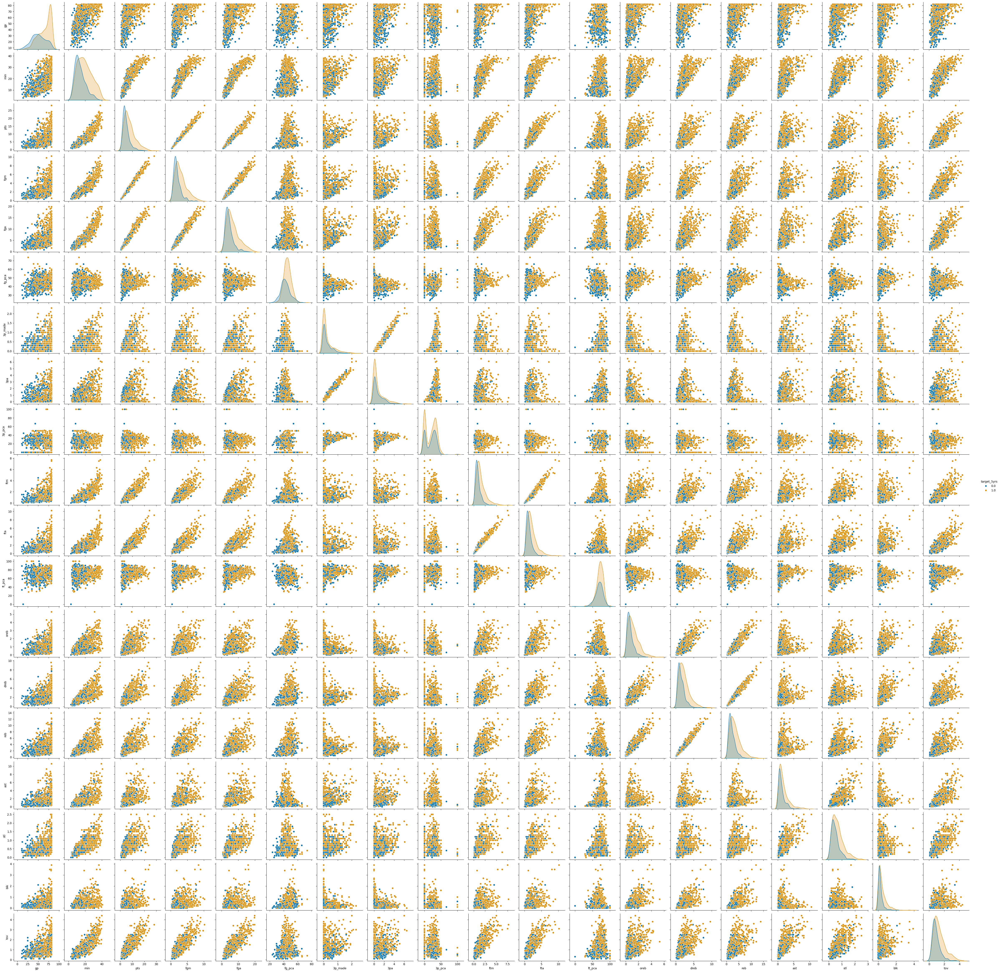

In [195]:
# i like to use the seaborn pairplot to see the correlation between the features, we can see the distribution of the features
# and the correlation between the features
g = sns.pairplot(df_clean,
             hue=target_col,
             diag_kind='kde',
             corner=False,
             palette="colorblind",
             )
plt.show()

Few features show some dependencies. Clearly, we observe a strong correlation for builded features (% features), it's make sense. 
Generaly speaking, we can choose to work only with independents variables, computed or not (non-degenerated phase space). It's wise, if we want explore the models based only on true state variables. But in general cases, we can keep both computed (e.g. features enginnering) and raw variables:
- modern ML frameworks are very efficients
- we want add some complexities it's help ML algorithm to generalize better. We always have to look for better state variables.
- in ideal case, selected variables (features) should make sense to business stackholders. It's relevant for model interpretability. 

One other fast and efficient way to check the pairwise relations between features is to build a correlation matrix

In [33]:
#correlation matrix
corr_matrix = df_clean[all_features].corr()

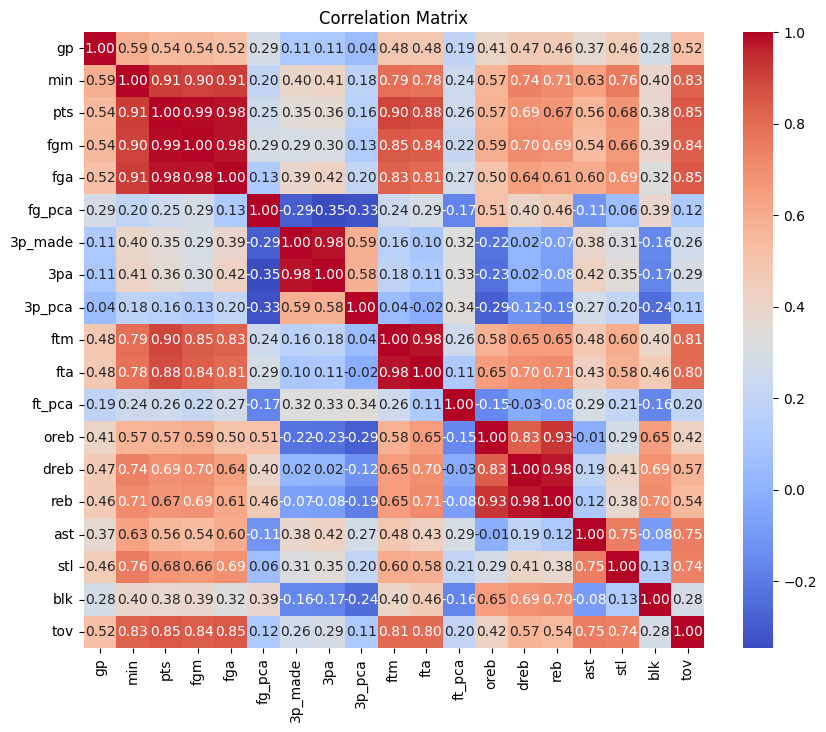

In [34]:
# visualize the correlation matrix
fig,ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr_matrix,
            annot=True,
            cmap='coolwarm',
            fmt=".2f",
            ax=ax
            )
plt.title("Correlation Matrix")
plt.show()

In [35]:
# get the minimum value
min_corr = corr_matrix.min().min()
# get the columns involved
min_corr_cols = corr_matrix.unstack().idxmin()

print('The minimum correlation is:', min_corr)
print('The columns involved are:', min_corr_cols)

# get the maximumm value
max_corr = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool_))
            .max().max())
# get the maximum value (excluding same columns)
# get the columns involved
max_corr_cols = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool_))
                 .stack().idxmax())

print('The maximun correlation was:', max_corr)
print('The columns involved are:', max_corr_cols)

The minimum correlation is: -0.34627845402421337
The columns involved are: ('fg_pca', '3pa')
The maximun correlation was: 0.9907260390475908
The columns involved are: ('pts', 'fgm')


We can use it to select the features 

let's verify the label balance

target_5yrs
1.0    805
0.0    489
Name: count, dtype: int64

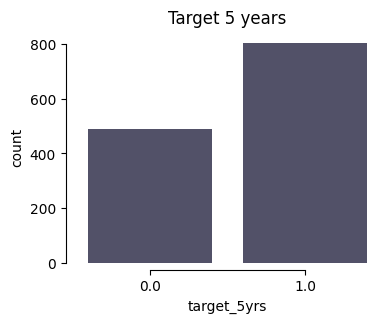

In [196]:
display(df_clean[target_col].value_counts())

# bar plot of target_5yrs
fig, ax = plt.subplots(figsize=(4, 3))
sns.countplot(x=target_col,
              data=df_clean,
              color = "#03012d",
              alpha = 0.7,
              ax=ax
              )
sns.despine(offset=5,
            trim=True,
            ax=ax
            )
ax.set_title('Target 5 years')
plt.show()

The labels repartition is slightly unbalanced, we can correct. For the actual goal we can continue with them as well.   

In [37]:
df_raw.columns

Index(['name', 'gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa',
       '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl',
       'blk', 'tov', 'target_5yrs'],
      dtype='object')

In [38]:
!pip install scipy

In [39]:
import scipy.stats as stats

# Select the BMI and sepsis columns from the dataset
points = df_raw['pts']
carrier = (df_raw[target_col] == 1).astype(bool).astype(int)

# Perform correlation analysis
correlation, p_value = stats.pearsonr(points, carrier)

# Print the correlation coefficient and p-value
print("Correlation coefficient:", correlation)
print("P-value:", p_value)

if p_value > 0.05:
    print('Fail to reject the null hypothesis. ')
else:
    print('Reject the null hypothesis')

Correlation coefficient: 0.33277791971792214
P-value: 7.827666020901528e-35
Reject the null hypothesis


### Univariate analysis of features

### Bivariate analysis of the target variable with the features

## Modelisation

In [41]:
# let's create a new dataframe with the features and the target
# some times we can keep golden copy of the data in memory to avoid to reload the data
df = df_clean.copy(deep=True)

In [42]:
df.sample(5,
          random_state=42
          )

,name,gp,min,pts,fgm,fga,fg_pca,3p_made,3pa,3p_pca,...,fta,ft_pca,oreb,dreb,reb,ast,stl,blk,tov,target_5yrs
351,Frank Brickowski,78,14.3,4.9,1.9,3.9,49.2,0.0,0.1,0.0,...,1.6,66.9,1.0,2.4,3.3,1.3,0.4,0.2,1.3,1.0
486,Ed Rains,49,13.0,3.9,1.6,3.6,43.5,0.0,0.0,0.0,...,1.3,59.4,0.8,0.9,1.6,0.8,0.4,0.0,0.5,0.0
599,Wade Baldwin,22,13.5,3.5,1.2,3.8,31.3,0.1,0.8,11.1,...,1.3,82.1,0.3,1.1,1.5,2.1,0.6,0.3,1.3,0.0
442,David Thirdkill,49,10.6,4.0,1.5,3.5,43.5,0.0,0.1,14.3,...,1.6,57.7,0.6,0.9,1.5,0.7,0.4,0.1,1.0,1.0
270,Kenny Gattison,77,14.3,5.2,1.9,4.0,47.6,0.0,0.0,0.0,...,2.2,63.2,1.1,2.4,3.5,0.5,0.3,0.4,1.1,1.0


### build the dataset

In [43]:
preprocessor = Preprocessor(df_clean,)
X, y, names = preprocessor.build_dataset()

assert X.shape[0] == y.shape[0]
assert X.shape[0] == len(names)
assert X.shape[1] == len(all_features)

In [44]:
print(X)
print(y)
print(names)

[[36.  27.4  7.4 ...  0.4  0.4  1.3]
 [35.  26.9  7.2 ...  1.1  0.5  1.6]
 [74.  15.3  5.2 ...  0.5  0.3  1. ]
 ...
 [43.  12.1  5.4 ...  0.3  0.4  0.9]
 [52.  12.   4.5 ...  0.4  0.1  0.8]
 [47.  11.7  4.4 ...  0.7  0.1  0.9]]
[0. 0. 0. ... 0. 1. 1.]
['Brandon Ingram', 'Andrew Harrison', 'JaKarr Sampson', 'Malik Sealy', 'Matt Geiger', 'Tony Bennett', 'Don MacLean', 'Tracy Murray', 'Duane Cooper', 'Dave Johnson', 'Corey Williams', 'Sam Mack', 'Lorenzo Williams', 'P.J. Hairston', 'Elmore Spencer', 'John Crotty', 'Stephen Howard', 'Randy Woods', 'Larry Johnson', 'Billy Owens', 'Stacey Augmon', 'Mark Macon', 'Steven Smith', 'Mitch McGary', 'Larry Stewart', 'Mike Iuzzolino', 'Doug Smith', 'Paul Graham', 'Donald Hodge', 'Dale Davis', 'Stanley Roberts', 'Terrell Brandon', 'Bison Dele', 'Spencer Dinwiddie', 'Tracy Moore', 'Greg Anthony', 'Kenny Anderson', 'Victor Alexander', 'David Benoit', 'Kevin Lynch', 'LaBradford Smith', 'Chris Corchiani', 'Travis Wear', 'Robert Pack', 'Pete Chilcutt', 'C

### Dataset Splitting

In [45]:
# create a train/val/test split
X_train, X_test, y_train, y_test = preprocessor.build_test_dataset()
print(X_train.shape,
      X_test.shape,
      y_train.shape,
      y_test.shape
      )


(1164, 19) (130, 19) (1164,) (130,)


In [46]:
print(X_train)
print(y_train)

[[0.92957746 0.45767196 0.30545455 ... 0.2        0.1025641  0.27906977]
 [0.01408451 0.32804233 0.14545455 ... 0.36       0.05128205 0.11627907]
 [0.21126761 0.24074074 0.07636364 ... 0.16       0.07692308 0.11627907]
 ...
 [0.85915493 0.3042328  0.16       ... 0.12       0.25641026 0.25581395]
 [0.16901408 0.42592593 0.12       ... 0.24       0.02564103 0.13953488]
 [0.84507042 0.34920635 0.14909091 ... 0.16       0.20512821 0.13953488]]
[1. 0. 0. ... 1. 0. 1.]


In [47]:
print(X_test)

[[0.94366197 0.2962963  0.15272727 ... 0.16       0.05128205 0.27906977]
 [0.53521127 0.26190476 0.11636364 ... 0.16       0.         0.09302326]
 [0.15492958 0.27513228 0.10181818 ... 0.24       0.07692308 0.27906977]
 ...
 [0.33802817 0.28571429 0.14909091 ... 0.08       0.02564103 0.13953488]
 [0.85915493 0.33862434 0.16       ... 0.2        0.02564103 0.1627907 ]
 [0.5915493  0.16666667 0.05454545 ... 0.2        0.02564103 0.20930233]]


### New features Creation

### Dataset balancing

Qunatity of data is sufficient. We can keep all samples in the class '0'  and select randomly an equal number of samples in the class '1'. A new dataset can be used for further modelling. We can even use more advanced technics. But it's not necessary here

### SVC Classification

In [ ]:
def model_selection_tool(model,
                         X_train,
                         y_train,
                         X_test,
                         y_test,
                         model_type:str='sklearn'
                         ):
    ml_model = MlModelWorkflow(model_type=model_type)
    ml_model.set_model(model)
    model_confusion_matrix,model_recal = ml_model.score_classifier(X_train,
                                                                   y_train
                                                                   )

    print(model_confusion_matrix)
    print(model_recal)

    ml_model.model.fit(X_train, y_train)
    recall_, precision_, accuracy_ = ml_model.evaluate_model(X_test,y_test)

    print(recall_, precision_, accuracy_)
    return model, recall_, precision_, accuracy_, model_confusion_matrix, model_recal

In [214]:
#example of scoring with support vector classifier
svc_model = SVC()
svc_estimator, recall_, precision_, accuracy_, kf_confusion_matrix, kf_recal = model_selection_tool(svc_model,
                                                                                                      X_train,
                                                                                                      y_train,
                                                                                                      X_test,
                                                                                                      y_test
                                                                                                      )

[[246. 196.]
 [133. 589.]]
0.8156283539910096
0.7349397590361446 0.7530864197530864 0.676923076923077


In [215]:
results = pd.DataFrame()
results = pd.DataFrame([['SVC', recall_, precision_, accuracy_, kf_recal]],
                        columns=['model', 'recall', 'precision', 'accuracy','recall_cv']
                        )
results


,model,recall,precision,accuracy,recall_cv
0,SVC,0.73494,0.753086,0.676923,0.815628


### Random Forest Classifier

In [216]:
rdfc_model = RandomForestClassifier(n_estimators=100,
                                   random_state=42
                                   )
rdfc_model, recall_, precision_, accuracy_, kf_confusion_matrix, kf_recal = model_selection_tool(rdfc_model,
                                                                                                      X_train,
                                                                                                      y_train,
                                                                                                      X_test,
                                                                                                      y_test
                                                                                                      )

[[241. 201.]
 [146. 576.]]
0.7971468177900602
0.7831325301204819 0.7738095238095238 0.7153846153846154


In [217]:
temp_results = pd.DataFrame([['RandomForestClassifier', recall_, precision_, accuracy_, kf_recal]],
                        columns=['model', 'recall', 'precision', 'accuracy','recall_cv']
                        )
results = pd.concat([results, temp_results])
results

,model,recall,precision,accuracy,recall_cv
0,SVC,0.734940,0.753086,0.676923,0.815628
0,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147


### Dumb LightGBM classifier

In [218]:
params = {
    "num_leaves": 5,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "learning_rate": 0.01,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "verbose": -1,
    "max_depth": 5,
}

lgbm_clf_model = lgb.LGBMClassifier(**params) # we can use the lightgbm classifier sklean api
lgbm_clf_model, recall_, precision_, accuracy_, kf_confusion_matrix, kf_recall = model_selection_tool(lgbm_clf_model,
                                                                                                      X_train,
                                                                                                      y_train,
                                                                                                      X_test,
                                                                                                      y_test
                                                                                                      )


[[177. 265.]
 [ 95. 627.]]
0.8686592739372898
0.8072289156626506 0.7127659574468085 0.6692307692307692


In [219]:
temp_results = pd.DataFrame([['LGBMClassifier', recall_, precision_, accuracy_, kf_recall]],
                        columns=['model', 'recall', 'precision', 'accuracy', 'recall_cv']
                        )
results = pd.concat([results, temp_results])
results

,model,recall,precision,accuracy,recall_cv
0,SVC,0.734940,0.753086,0.676923,0.815628
0,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147
0,LGBMClassifier,0.807229,0.712766,0.669231,0.868659


### Gradient Boosting Classifier

In [220]:
from sklearn.ensemble import GradientBoostingClassifier
gb_model = GradientBoostingClassifier()
gb_model, recall_, precision_, accuracy_, kf_confusion_matrix, kf_recall = model_selection_tool(gb_model,
                                                                                                      X_train,
                                                                                                      y_train,
                                                                                                      X_test,
                                                                                                      y_test
                                                                                                      )


[[218. 224.]
 [138. 584.]]
0.8082555878845641
0.8192771084337349 0.7640449438202247 0.7230769230769231


In [221]:
temp_results = pd.DataFrame([['GradientBoostingClassifier', recall_, precision_, accuracy_, kf_recall]],
                        columns=['model', 'recall', 'precision', 'accuracy', 'recall_cv']
                        )
results = pd.concat([results, temp_results])


In [222]:
results

,model,recall,precision,accuracy,recall_cv
0,SVC,0.734940,0.753086,0.676923,0.815628
0,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147
0,LGBMClassifier,0.807229,0.712766,0.669231,0.868659
0,GradientBoostingClassifier,0.819277,0.764045,0.723077,0.808256


In [223]:
### Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier

dtc_model = DecisionTreeClassifier()
dtc_model, recall_, precision_, accuracy_, kf_confusion_matrix, kf_recall = model_selection_tool(dtc_model,
                                                                                                      X_train,
                                                                                                      y_train,
                                                                                                      X_test,
                                                                                                      y_test
                                                                                                      )


[[204. 238.]
 [216. 506.]]
0.7011956562795904
0.6385542168674698 0.726027397260274 0.6153846153846154


In [224]:
temp_results = pd.DataFrame([['DecisionTreeClassifier', recall_, precision_, accuracy_, kf_recall]],
                        columns=['model', 'recall', 'precision', 'accuracy', 'recall_cv']
                        )
results = pd.concat([results, temp_results])
results

,model,recall,precision,accuracy,recall_cv
0,SVC,0.734940,0.753086,0.676923,0.815628
0,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147
0,LGBMClassifier,0.807229,0.712766,0.669231,0.868659
0,GradientBoostingClassifier,0.819277,0.764045,0.723077,0.808256
0,DecisionTreeClassifier,0.638554,0.726027,0.615385,0.701196


In [225]:
results.sort_values(by='recall_cv', ascending=False).reset_index(drop=True)

,model,recall,precision,accuracy,recall_cv
0,LGBMClassifier,0.807229,0.712766,0.669231,0.868659
1,SVC,0.734940,0.753086,0.676923,0.815628
2,GradientBoostingClassifier,0.819277,0.764045,0.723077,0.808256
3,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147
4,DecisionTreeClassifier,0.638554,0.726027,0.615385,0.701196


### Hyperparameter tuning

Fine-tune the top model with GridSearchCV

In [226]:
from sklearn.model_selection import GridSearchCV
#make scorer
from sklearn.metrics import make_scorer, accuracy_score

scoring = {'accuracy': make_scorer(accuracy_score),
           'recall_': make_scorer(recall_score)}

params_grid = {
    "num_leaves": [2,5,10, 15, 20],
    "min_data_in_leaf": [2,5,10],
    "learning_rate": [0.01, 0.05, 0.1],
    "max_depth": [-1, 3, 5, 8],
    "subsample": [0.8, 0.9],
    "colsample_bytree": [0.8, 0.9],
}

lgbm_clf_model = lgb.LGBMClassifier(boosting_type = "gbdt",
                                    max_bin = 255,
                                    objective= "binary",
                                    metric =  "binary_logloss",
                                    random_state=42
                                    )

In [227]:
# clean some memory
import gc
gc.collect()

1138002

In [125]:
# create the grid search

lgbm_clf_model_grid_search = GridSearchCV(lgbm_clf_model,
                                params_grid,
                                scoring=scoring,
                                cv=3,
                                return_train_score=True,
                                refit='recall_',
                                )

In [126]:
# train the model
lgbm_clf_model_grid_search.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=LGBMClassifier(max_bin=255, metric='binary_logloss',
                                      objective='binary', random_state=42),
             param_grid={'colsample_bytree': [0.8, 0.9],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [-1, 3, 5, 8],
                         'min_data_in_leaf': [2, 5, 10],
                         'num_leaves': [2, 5, 10, 15, 20],
                         'subsample': [0.8, 0.9]},
             refit='recall_', return_train_score=True,
             scoring={'accuracy': make_scorer(accuracy_score, response_method='predict'),
                      'recall_': make_scorer(recall_score, response_method='predict')})

In [129]:
best_lgbm_clf = lgbm_clf_model_grid_search.best_estimator_
best_lgbm_clf

LGBMClassifier(colsample_bytree=0.9, learning_rate=0.01, max_bin=255,
               metric='binary_logloss', min_data_in_leaf=2, num_leaves=2,
               objective='binary', random_state=42, subsample=0.8)

In [228]:
best_lgbm_clf, recall_, precision_, accuracy_, kf_confusion_matrix, kf_recall = model_selection_tool(best_lgbm_clf,
                                                                                                      X_train,
                                                                                                      y_train,
                                                                                                      X_test,
                                                                                                      y_test
                                                                                                      )

[[119. 323.]
 [ 68. 654.]]
0.9065807987519939
0.8795180722891566 0.6759259259259259 0.6538461538461539


In [229]:
finetuned_results = pd.DataFrame([['LGBMClassifier_finetuned', recall_, precision_, accuracy_, kf_recall]],
                        columns=['model', 'recall', 'precision', 'accuracy', 'recall_cv']
                        )
finetuned_results
results = pd.concat([results, finetuned_results])
results

,model,recall,precision,accuracy,recall_cv
0,SVC,0.734940,0.753086,0.676923,0.815628
0,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147
0,LGBMClassifier,0.807229,0.712766,0.669231,0.868659
0,GradientBoostingClassifier,0.819277,0.764045,0.723077,0.808256
0,DecisionTreeClassifier,0.638554,0.726027,0.615385,0.701196
0,LGBMClassifier_finetuned,0.879518,0.675926,0.653846,0.906581


In [230]:
results.sort_values(by='recall_cv', ascending=False).reset_index(drop=True)

,model,recall,precision,accuracy,recall_cv
0,LGBMClassifier_finetuned,0.879518,0.675926,0.653846,0.906581
1,LGBMClassifier,0.807229,0.712766,0.669231,0.868659
2,SVC,0.734940,0.753086,0.676923,0.815628
3,GradientBoostingClassifier,0.819277,0.764045,0.723077,0.808256
4,RandomForestClassifier,0.783133,0.773810,0.715385,0.797147
5,DecisionTreeClassifier,0.638554,0.726027,0.615385,0.701196


### Model features importance interpretation

We will use SHAP framework

In [231]:
import shap

# print the JS visualization code to the notebook
shap.initjs()

In [232]:
# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(best_lgbm_clf)
shap_values = explainer.shap_values(X_test)

/Users/ramansheshka/.pyenv/versions/3.10.6/envs/mp_data/lib/python3.10/site-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


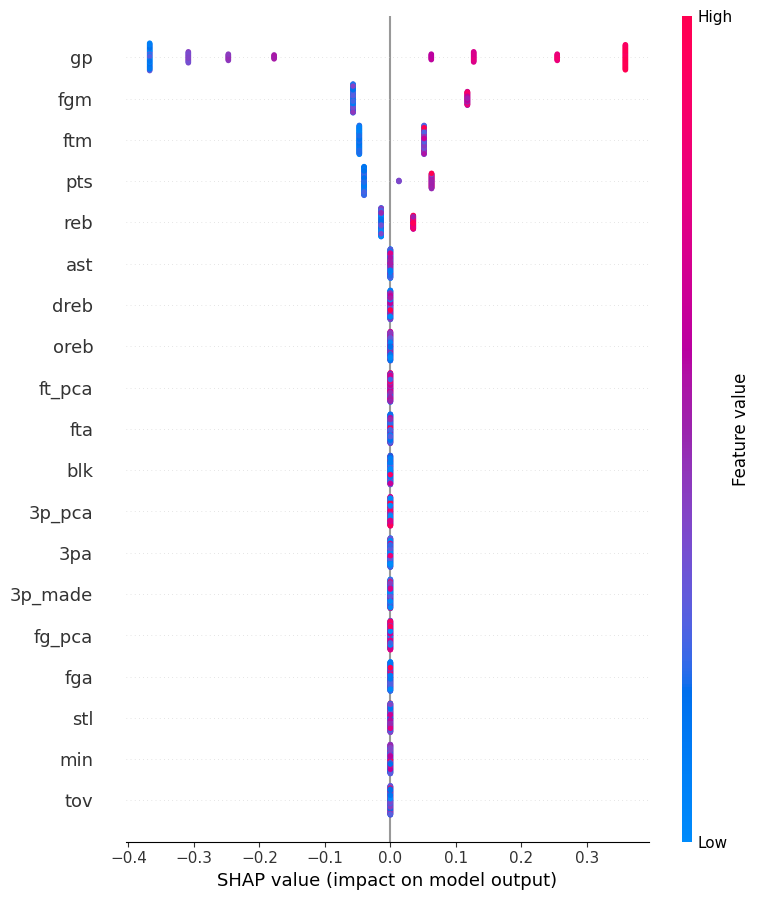

In [233]:
shap.summary_plot(shap_values,
                  X_test,
                  feature_names=all_features
                  )

In [234]:
shap_values[3]

array([-0.30844933,  0.        , -0.04011973, -0.0569958 ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.04738409,
        0.        ,  0.        ,  0.        ,  0.        , -0.01408841,
        0.        ,  0.        ,  0.        ,  0.        ])

In [235]:
explainer.expected_value

0.5135747025596548

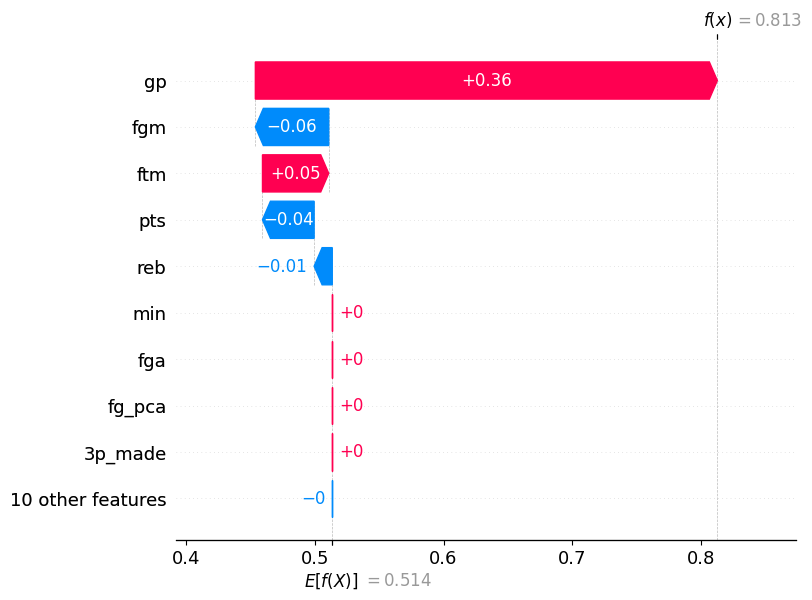

In [236]:
index = 0
shap.plots._waterfall.waterfall_legacy(explainer.expected_value,
                                       shap_values[index],
                                       feature_names=all_features,)

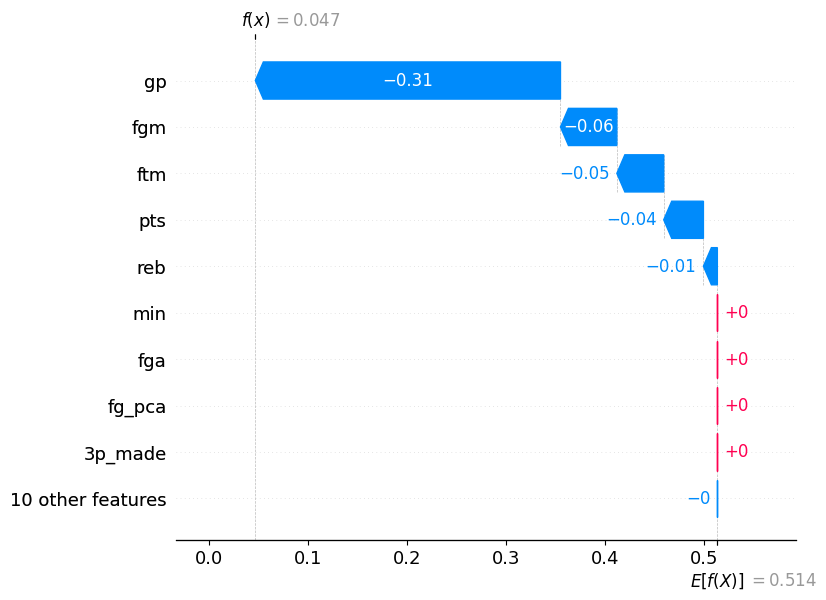

In [237]:
index = 1
shap.plots._waterfall.waterfall_legacy(explainer.expected_value,
                                       shap_values[index],
                                       feature_names=all_features,)

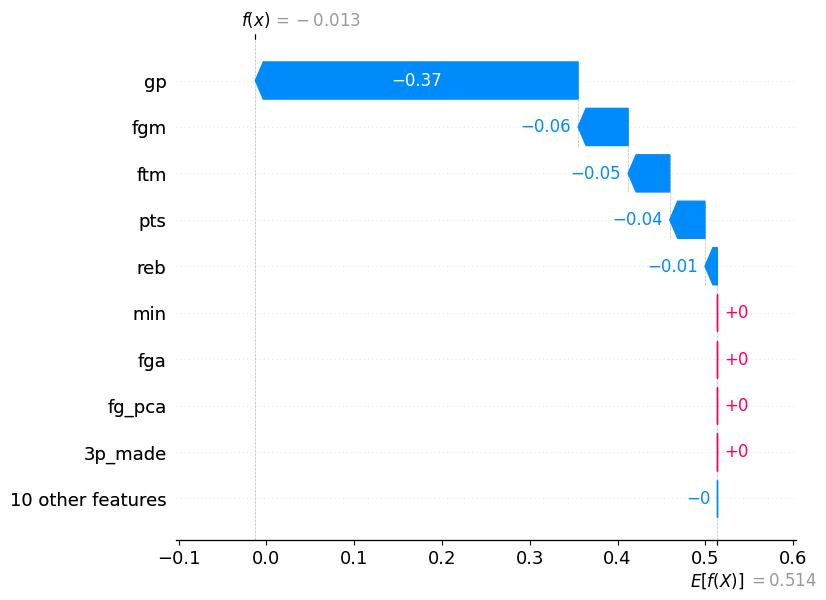

In [238]:
index = 6
shap.plots._waterfall.waterfall_legacy(explainer.expected_value,
                                       shap_values[index],
                                       feature_names=all_features,)

We can also use SHAP values to explain the model to the business. For modeling purposes, SHAP analysis can help us reduce the number of features and potentially improve model performance.

However, I don't expect significant performance gains by reducing features here, as the model is already quite lightweight.

In a typical use case, at this stage, it’s important to understand the business implications of each feature. Some features, while having a smaller impact on the model’s current output, may be valuable for insights or decision-making. To give these features more weight, we could consider:

- Developing new feature engineering approaches
- Applying more advanced data balancing techniques
- Using advanced statistical multivariate correlation estimates to select features


In [239]:
# let's save the model in a file
best_lgbm = MlModelWorkflow(model_type='sklearn')
best_lgbm.set_model(best_lgbm_clf)
best_lgbm.save_model()

Saving model...
Folder /Users/ramansheshka/code/test_datascience_mpdata/save_models already exists
Model saved!


In [240]:
best_lgbm.model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 0.9,
 'importance_type': 'split',
 'learning_rate': 0.01,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 2,
 'objective': 'binary',
 'random_state': 42,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 0.8,
 'subsample_for_bin': 200000,
 'subsample_freq': 0,
 'max_bin': 255,
 'metric': 'binary_logloss',
 'min_data_in_leaf': 2}

## Test fast API service

In [293]:
# let's first replace 3 by three in the columns
encoded_features_list = [s_.replace('3', 'three_') for s_ in all_features]
print(all_features)
print(encoded_features_list)

['gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov']
['gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', 'three_p_made', 'three_pa', 'three_p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov']


In [290]:
intex = 4
my_test_dict = pd.DataFrame([X_test[index]], columns=encoded_features_list).to_dict(orient='records')[0]
print(my_test_dict)


{'gp': 0.28169014084507044, 'min': 0.20105820105820105, 'pts': 0.09818181818181818, 'fgm': 0.09090909090909091, 'fga': 0.13157894736842105, 'fg_pca': 0.23046092184368733, 'three_p_made': 0.2173913043478261, 'three_pa': 0.3230769230769231, 'three_p_pca': 0.258, 'ftm': 0.06493506493506493, 'fta': 0.08823529411764708, 'ft_pca': 0.552, 'oreb': 0.05660377358490566, 'dreb': 0.09574468085106384, 'reb': 0.08088235294117646, 'ast': 0.03773584905660378, 'stl': 0.12, 'blk': 0.025641025641025647, 'tov': 0.023255813953488372}


In [299]:
!cd {PARENT_BASE_PATH} && ls

Makefile           data               mpdatanba.egg-info save_models
README.md          data_test          notebooks          setup.py
TODO.md            mpdatanba          requirements.txt


in terminal :

- go to the project parent directory
- run command :
  
  ```bash 
  make run_fastapi
  ```

In [301]:
import requests

# Define the base URL and endpoint
base_url = "http://127.0.0.1:8000"
url_health = f"{base_url}/health"
check_base = requests.get(base_url)
print(check_base.status_code, check_base.text)
check_health = requests.get(url_health)
print(check_health.status_code, check_health.text)
url_info = f"{base_url}/info"
check_model_info = requests.get(f"{url_info}")
print(check_model_info.status_code, check_model_info.text)


url_predict = f"{base_url}/predict"


# Define the user input
user_req = my_test_dict
user_req
assert len(user_req) == len(all_features)
# Send a POST request
response = requests.post(url_predict, json=user_req)

# Check the response
if response.status_code == 200:
     print("Prediction:", response.json()["prediction"])
else:
     print("Error:", response.status_code, response.text)

assert response.status_code == 200
assert response.json()["prediction"] == y_test[index]


200 {"message":"Welcome to the NBA player prediction API"}
200 {"status":"ok"}
200 {"model info":{"model name":"LGBMClassifier","model parameters":{"boosting_type":"gbdt","class_weight":null,"colsample_bytree":0.9,"importance_type":"split","learning_rate":0.01,"max_depth":-1,"min_child_samples":20,"min_child_weight":0.001,"min_split_gain":0.0,"n_estimators":100,"n_jobs":null,"num_leaves":2,"objective":"binary","random_state":42,"reg_alpha":0.0,"reg_lambda":0.0,"subsample":0.8,"subsample_for_bin":200000,"subsample_freq":0,"max_bin":255,"metric":"binary_logloss","min_data_in_leaf":2}}}
Prediction: [0.0]


## Sandbox

Some cells in this part contains errors, run with cautioness

### Train LightGBM model

In [53]:
def recall_eval(preds, train_data):
    threshold = 0.5
    labels = train_data.get_label()
    preds_binary = (preds > threshold).astype(int) #np.round(preds) should be the same
    recall_ = recall_score(labels, preds_binary)
    return 'recall', recall_, True #return name, value, is_higher_better

In [54]:
X_train_, X_val, y_train_, y_val = train_test_split(X_train,
                                                    y_train,
                                                    random_state=42,
                                                    test_size=0.2,
                                                    )
print(X_train_.shape,
      X_val.shape,
      y_train_.shape,
      y_val.shape
      )

train_data = lgb.Dataset(X_train_, label=y_train_)

val_data = lgb.Dataset(X_val, label=y_val)

params = {
    "num_leaves": 5,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "learning_rate": 0.01,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "verbose": 10,
    "max_depth": 5,
}

model = lgb.train(
     params,
     train_set = train_data,
     num_boost_round=100,
     valid_sets=[val_data],
     feval=recall_eval,
    )

(931, 19) (233, 19) (931,) (233,)
[LightGBM] [Info] Number of positive: 576, number of negative: 355
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.064503
[LightGBM] [Debug] init for col-wise cost 0.000002 seconds, init for row-wise cost 0.000158 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1699
[LightGBM] [Info] Number of data points in the train set: 931, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.618690 -> initscore=0.483990
[LightGBM] [Info] Start training from score 0.483990
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves =

In [55]:
proba_pred = model.predict(X_test)
threshold = 0.5
y_pred = (proba_pred > threshold).astype(int)
print(y_pred)
recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[1 1 0 0 1 1 0 1 1 1 0 0 1 0 0 1 1 1 1 1 1 1 1 0 0 0 0 0 1 1 0 0 0 1 1 1 1
 0 1 1 0 1 0 1 0 1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 1 1 0 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0 1 0]
recall score : 0.8433734939759037


#### SHAP values, feature importance

In [56]:
import shap

# print the JS visualization code to the notebook
shap.initjs()

/Users/ramansheshka/.pyenv/versions/3.10.6/envs/mp_data/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [57]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X)

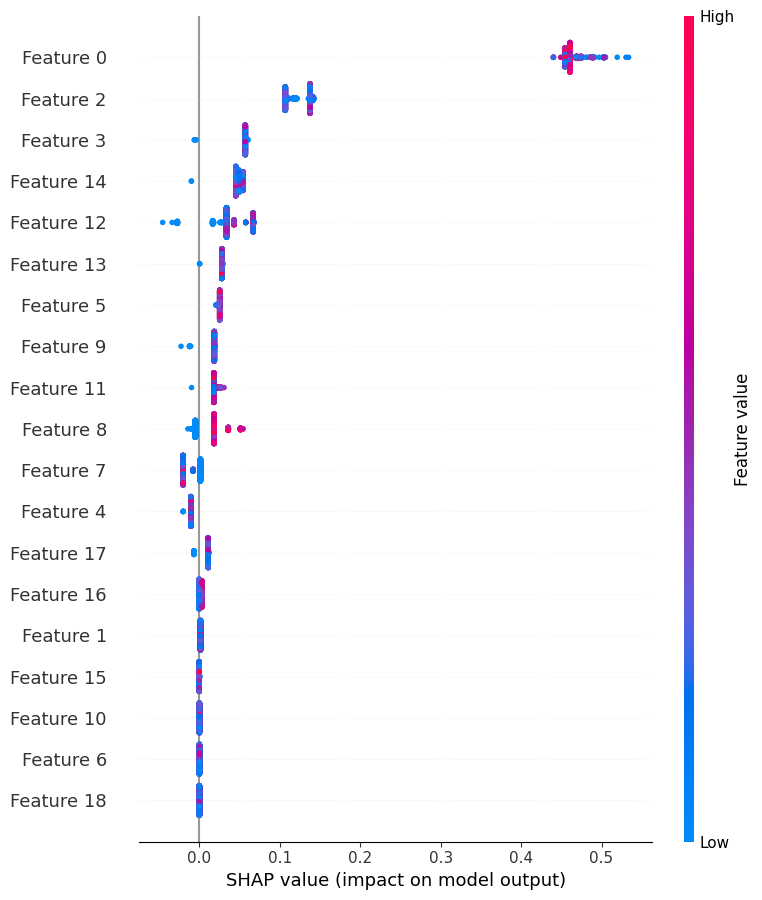

In [58]:
shap.summary_plot(shap_values, X)

So let's select the most important features and retrain the model

In [81]:
print(all_features)
selected_features = [all_features[i] for i in [0,3,5,12,14,2,9,11,18]]
print(selected_features)

['gp', 'min', 'pts', 'fgm', 'fga', 'fg_pca', '3p_made', '3pa', '3p_pca', 'ftm', 'fta', 'ft_pca', 'oreb', 'dreb', 'reb', 'ast', 'stl', 'blk', 'tov']
['gp', 'fgm', 'fg_pca', 'oreb', 'reb', 'pts', 'ftm', 'ft_pca', 'tov']


In [93]:
X_selected, y_selected, names = build_dataset(df_clean,
                              features=selected_features
                              )
X_train_selected, X_test_selected, y_train_selected, y_test_selected = train_test_split(X_selected,
                                                    y_selected,
                                                    test_size=0.1,
                                                    random_state=42
                                                    )

X_train_, X_val, y_train_, y_val = train_test_split(X_train_selected,
                                                    y_train_selected,
                                                    random_state=42,
                                                    test_size=0.2,
                                                    )
print(X_train_.shape,
      X_val.shape,
      y_train_.shape,
      y_val.shape
      )

train_data = lgb.Dataset(X_train_, label=y_train_)

val_data = lgb.Dataset(X_val, label=y_val)

params = {
    "num_leaves": 5,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "learning_rate": 0.01,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "verbose": 10,
    "max_depth": 5,
}

model_selected = lgb.train(
     params,
     train_set = train_data,
     num_boost_round=100,
     valid_sets=[val_data],
     feval=recall_eval,
    )

(956, 9) (239, 9) (956,) (239,)
[LightGBM] [Info] Number of positive: 592, number of negative: 364
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.001627
[LightGBM] [Debug] init for col-wise cost 0.000002 seconds, init for row-wise cost 0.000091 seconds
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000198 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 943
[LightGBM] [Info] Number of data points in the train set: 956, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.619247 -> initscore=0.486353
[LightGBM] [Info] Start training from score 0.486353
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 and depth = 3
[LightGBM] [Debug] Trained a tree with leaves = 5 a

In [95]:
proba_pred = model_selected.predict(X_test_selected)
threshold = 0.5
y_pred = (proba_pred > threshold).astype(int)
print(y_pred)
recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1
 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0
 1 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1]
recall score : 0.8620689655172413


In [123]:

# from mpdatanba.utils import create_folder_if_not_exists

# # create a folder to save the model
# model_folder = os.path.join(parent_dir,
#                             "save_models"
#                             )
# print(model_folder)
# create_folder_if_not_exists(model_folder)

# # save the model
# model_file = os.path.join(model_folder,
#                           "model_selected.txt"
#                           )
from mpdatanba.ml_logic.ml_workflow import save_model
save_model(model_selected)

Saving model...
Model saved!


In [124]:
# # load the model
# def load_model(model_file,
#                sklearn:bool=False,
#                ) :
#     if not sklearn:
#         model = lgb.Booster(model_file=model_file)
#     return model

from mpdatanba.ml_logic.ml_workflow import load_model

model_loaded = load_model()

Loading model...
[LightGBM] [Debug] Skipped header "tree" in file /Users/ramansheshka/code/test_datascience_mpdata/save_models/model_selected.txt
[LightGBM] [Debug] Skipped header "tree" in file /Users/ramansheshka/code/test_datascience_mpdata/save_models/model_selected.txt
[LightGBM] [Debug] Time for loading model: 0.005552 seconds
Model loaded from local disk


In [108]:
def predict_model(model,
                  X,
                  threshold:float=0.5,
                  ) :
    if isinstance(X, pd.DataFrame):
        X = X.values
    if isinstance(model, lgb.basic.Booster):
        proba_pred = model.predict(X)
        y_pred = (proba_pred > threshold).astype(int)
    else:
        # use sklearn model
        y_pred = model.predict(X)
    return y_pred

proba_pred = model_loaded.predict(X_test_selected)
y_pred = predict_model(model_loaded,
                       X_test_selected,
                        )
print(y_pred)
recall_ = recall_score(y_test, y_pred)
print(f"recall score : {recall_}")

[0 1 0 0 1 0 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1
 0 0 0 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 0 0
 1 1 0 1 1 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1]
recall score : 0.8620689655172413


In [116]:
# let's build test dataset to predict by api

api_x_test_normalized = X_test_selected[5]
print(api_x_test_normalized)

y_pred_api_test = predict_model(model_loaded,
                                [api_x_test_normalized],
                                )
print(y_pred_api_test)

print(y_test[5])

[0.52112676 0.06060606 0.28657315 0.01886792 0.04411765 0.05090909
 0.02597403 0.563      0.13953488]
[0]
0.0


In [131]:
data_test = np.array([0.52112676,
                          0.06060606,
                          0.28657315,
                          0.01886792,
                          0.04411765,
                          0.05090909,
                          0.02597403,
                          0.563,
                          0.13953488
                          ])
print(data_test)
toto = predict_model(model_loaded,
              [data_test],
              )
toto.tolist()

[0.52112676 0.06060606 0.28657315 0.01886792 0.04411765 0.05090909
 0.02597403 0.563      0.13953488]


[0]

### REST API with flask

### FINE TUNING

In [88]:
! pip install optuna

In [89]:
import optuna

study = optuna.create_study(direction="maximize")

[I 2024-11-06 17:33:45,734] A new study created in memory with name: no-name-ce477b3b-e0bf-4161-aecf-2d600945d5a2


### Define Kfold cross-validation for LightGBM

In [90]:
# some lgbm parametrs from my previous projects
lgb_params = {
    'lambda_l1': 0.1,
    'lambda_l2': 0.5,
    'num_leaves': 5,
    'feature_fraction': 0.5,
    'bagging_fraction': 0.5,
    'bagging_freq': 5,
    'min_child_samples': 5,
    'learning_rate': 0.01,
    'task': 'train',
    'objective': 'binary',
    'boosting_type': 'gbdt',
    'seed': 42,
    "min_data_in_leaf": 5,
    "max_bin": 255,
    "verbose": 10,
    "max_depth": 5,
    'is_unbalance': True,
}


def lgbm_kfold_train(X_train,
                     y_train,
                     nb_splits:int=3
                     ):
    kf = KFold(n_splits=nb_splits,
               random_state=50,
               shuffle=True
               )
    n_ = 0
    confusion_mat = np.zeros((2,2))
    recall = 0
    for train_ids,val_ids in kf.split(X_train, y_train):
        if isinstance(X_train, pd.DataFrame) and isinstance(y_train, pd.Series):
            X_train_ = X_train.iloc[train_ids]
            X_val = X_train.iloc[val_ids]
            y_train_ = y_train.iloc[train_ids]
            y_val = y_train.iloc[val_ids]
        if isinstance(X_train, np.ndarray) and isinstance(y_train, np.ndarray):
            X_train_ = X_train[train_ids]
            X_val = X_train[val_ids]
            y_train_ = y_train[train_ids]
            y_val = y_train[val_ids]

        # create lgb.Dataset
        lgbm_X_train_ = lgb.Dataset[X_train_, y_train_]
        lgbm_X_val = lgb.Dataset[X_val, y_val]
        lgbm_model = lgb.train(
            lgb_params,
            train_set = lgbm_X_train_,
            num_boost_round=100,
            valid_sets=[lgbm_X_val],
            feval=recall_eval,
        )
        classifier.fit(training_set,training_labels)
        predicted_labels = classifier.predict(test_set)
        confusion_mat+=confusion_matrix(test_labels,predicted_labels)
        recall += recall_score(test_labels, predicted_labels)
    recall/=nb_splits


#### define the objective function

In [91]:
def objective(trial):

#     "boosting_type": "gbdt",
#     "objective": "binary",
#     "metric": "recall",
#     "verbose": -1,

  # Determine the hyperperatemers and their value ranges
  learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
  num_leaves = trial.suggest_int("num_leaves", 2, 6)
  max_depth = trial.suggest_int("max_depth", -1, 6)
  min_child_samples = trial.suggest_int("min_child_samples", 5, 100)
  subsample = trial.suggest_float("subsample", 0.5, 1.0)
  colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)
  n_estimators = trial.suggest_int("n_estimators", 20, 200)
  min_data_in_leaf = trial.suggest_int("min_data_in_leaf", 5, 25)


  # Create and train the model
  model = lgb.LGBMClassifier(
  learning_rate=learning_rate,
  num_leaves=num_leaves,
  max_depth=max_depth,
  min_child_samples=min_child_samples,
  subsample=subsample,
  colsample_bytree=colsample_bytree,
  n_estimators=n_estimators,
  random_state=42
  )
  model.fit(X_train, y_train)

  # Evaluate model and return the metric
  y_pred = model.predict(X_test)
  accuracy = accuracy_score(y_test, y_pred)
  return accuracy